This code was originally written by Lin Lin Lee and then modified by Frederick Eberhardt

In [1]:
import numpy as np
import pandas as pd
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import glob
import seaborn as sns
from natsort import natsorted # Must be pip-installed.
import math # For infinity
import sys
import re
from scipy.io import loadmat
# Enable 3D plotting of channels
%matplotlib widget 
%matplotlib inline

In [2]:
# Defining the path
# !pwd
data_paths = ['/home/liang134@chapman.edu/Documents/HCP_MEG/data/100307/MEG/Restin/rmegpreproc/100307_MEG_3-Restin_rmegpreproc.mat',
              '/home/liang134@chapman.edu/Documents/HCP_MEG/data/100307/MEG/Restin/rmegpreproc/100307_MEG_4-Restin_rmegpreproc.mat',
              '/home/liang134@chapman.edu/Documents/HCP_MEG/data/100307/MEG/Restin/rmegpreproc/100307_MEG_5-Restin_rmegpreproc.mat',
              '/home/liang134@chapman.edu/Documents/HCP_MEG/data/116524/MEG/Restin/rmegpreproc/116524_MEG_3-Restin_rmegpreproc.mat',
              '/home/liang134@chapman.edu/Documents/HCP_MEG/data/116524/MEG/Restin/rmegpreproc/116524_MEG_4-Restin_rmegpreproc.mat',
              '/home/liang134@chapman.edu/Documents/HCP_MEG/data/116524/MEG/Restin/rmegpreproc/116524_MEG_5-Restin_rmegpreproc.mat',
              '/home/liang134@chapman.edu/Documents/HCP_MEG/data/158136/MEG/Restin/rmegpreproc/158136_MEG_3-Restin_rmegpreproc.mat',
              '/home/liang134@chapman.edu/Documents/HCP_MEG/data/158136/MEG/Restin/rmegpreproc/158136_MEG_4-Restin_rmegpreproc.mat',
              '/home/liang134@chapman.edu/Documents/HCP_MEG/data/158136/MEG/Restin/rmegpreproc/158136_MEG_5-Restin_rmegpreproc.mat']
            
           
layout_path = '/home/liang134@chapman.edu/Documents/HCP_MEG/scripts/megconnectome-3.0/template/'

In [3]:
## Block reserve for testing the matlab data structure
# data = loadmat(data_path[0])
# this_data = data['data']
# val = this_data[0,0]

In [4]:
## Code for extracting data, mapping channels and plotting channels
def extract_data(data_path):
    # Extract useful data from the matlab data structure
    data = {}
    raw = loadmat(data_path)
    val = raw['data'][0,0]
    data['sen_chanpos'] = val['grad']['chanpos'][0,0]
    print('Sensor channel position {} extracted...'.format(data['sen_chanpos'].shape))    
    data['sen_chantype'] = np.hstack(np.hstack(val['grad']['chantype'][0,0]))
    print('Sensor channel type {} extracted...'.format(data['sen_chantype'].shape))
    data['sen_label'] = np.hstack(np.hstack(val['grad']['label'][0,0]))
    print('Sensor channel label {} extracted...'.format(data['sen_label'].shape))
    data['SF'] = val['fsample'][0,0]
    print('Sampling frequency {} extracted ...'.format(data['SF']))
    data['label'] = np.hstack(np.hstack(val['label']))
    print('Labels after preprocessing {} extracted ...'.format(data['label'].shape))
    data['trial'] = extract_trial_data_sctructure(np.hstack(val['trial']))
    print('Trials after preprocessing {} extracted ...'.format(data['trial'].shape))
    data['time'] = np.hstack(np.hstack(val['time'][0,0]))
    print('The time course of the trials {} extracted ...'.format(data['time'].shape))
    return data

def extract_channel_type_index(data):
    unique_chantype = np.unique(data['sen_chantype'])
    
    meg_ix = data["sen_chantype"] == unique_chantype[0] # meg indexes
    megmag_ix = data["sen_chantype"] == unique_chantype[1] # megmag indexes
    refgrad_ix = data["sen_chantype"] == unique_chantype[2] # refgrad indexes
    refmag_ix = data["sen_chantype"] == unique_chantype[3] # refmag indexes
    return {'meg': meg_ix,
            'megmag': megmag_ix,
            'refgrad': refgrad_ix,
            'refmag': refmag_ix}

def plot_channel_location(data, sensor=False, plot_label=True):
    indexes = extract_channel_type_index(data)
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    
    if sensor == True:
        ax.scatter(data["sen_chanpos"][indexes['meg'],0], data["sen_chanpos"][indexes['meg'],1], data["sen_chanpos"][indexes['meg'],2], c='skyblue', s=60)
        ax.scatter(data["sen_chanpos"][indexes['megmag'],0], data["sen_chanpos"][indexes['megmag'],1], data["sen_chanpos"][indexes['megmag'],2], c='red', s=60)
        ax.scatter(data["sen_chanpos"][indexes['refgrad'],0], data["sen_chanpos"][indexes['refgrad'],1], data["sen_chanpos"][indexes['refgrad'],2], c='green', s=60)
        ax.scatter(data["sen_chanpos"][indexes['refmag'],0], data["sen_chanpos"][indexes['refmag'],1], data["sen_chanpos"][indexes['refmag'],2], c='yellow', s=60)
    
    else:
        for chan in data["label"]:
            ax.scatter(data["sen_chanpos"][data["sen_label"]==chan, 0], data["sen_chanpos"][data["sen_label"]==chan, 1], data["sen_chanpos"][data["sen_label"]==chan, 2], c='skyblue', s=60)
    
    if plot_label:
        for i, txt in enumerate(data['label']):
            ax.text(data["sen_chanpos"][i,0], data["sen_chanpos"][i,1], data["sen_chanpos"][i,2], txt)
    plt.show()
    
    
def intersection(lst1, lst2): 
    return list(set(lst1) & set(lst2))
    
def plot_left_right_channels(data, left_channels, right_channels, middle_channels):
    indexes = extract_channel_type_index(data)
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    for chan in intersection(["A"+str(left_channels[i]) for i in range(len(left_channels))], data['label']):
        ax.scatter(data["sen_chanpos"][data["sen_label"]==chan, 0], data["sen_chanpos"][data["sen_label"]==chan, 1], data["sen_chanpos"][data["sen_label"]==chan, 2], c='skyblue', s=60)
    
    for chan in intersection(["A"+str(right_channels[i]) for i in range(len(right_channels))], data['label']):
        if chan == 'A233':
            # So A233 is a very wired channel. I don't know what to say about it. The position of the y axis is flipped
            ax.scatter(data["sen_chanpos"][data["sen_label"]==chan, 0], -data["sen_chanpos"][data["sen_label"]==chan, 1], data["sen_chanpos"][data["sen_label"]==chan, 2], c='blue', s=60)
            # continue
        else:
            ax.scatter(data["sen_chanpos"][data["sen_label"]==chan, 0], data["sen_chanpos"][data["sen_label"]==chan, 1], data["sen_chanpos"][data["sen_label"]==chan, 2], c='red', s=60)
    
    for chan in intersection(["A"+str(middle_channels[i]) for i in range(len(middle_channels))], data['label']):
        ax.scatter(data["sen_chanpos"][data["sen_label"]==chan, 0], data["sen_chanpos"][data["sen_label"]==chan, 1], data["sen_chanpos"][data["sen_label"]==chan, 2], c='green', s=60)
    
def ordering(chan_order, label_order):
    indexes = []
    for chan in chan_order:
        indexes.append(list(label_order).index(chan))
    return indexes

def extract_trial_data_sctructure(trials):
    tmp = np.zeros([trials[0].shape[0], trials[0].shape[1], len(trials)])

    for i in range(len(trials)):
        tmp[:,:,i] = trials[i]
    return tmp

In [5]:
# Plotting functions from Frederick and Linlin

def matshow(data, title, title_caption=None, x=127, y=10, s=(None, None), colorbar=False, title_y=1.08, title_x=0.55, height=None, width=None, vrange=None):
    if height == None or width == None:
        fig, ax = plt.subplots(figsize=(5, 5))
    else:
        fig, ax = plt.subplots(figsize=(width,height))
    if vrange == None:
        m = ax.matshow(data, aspect="auto")
    else:
        m = ax.matshow(data, aspect="auto", vmin=vrange[0], vmax=vrange[1])
    if s[0] == None:
        ax.set_xticks(range(x))
        ax.set_xticklabels([i+1 for i in range(x)])
        ax.set_yticks(range(y))
        ax.set_yticklabels([i+1 for i in range(y)])
    else:
        ax.set_xticks([i*s[0] for i in range(int(x/s[0]))])
        ax.set_xticklabels([i*s[0] + 1 for i in range(int(x/s[0]))])
        ax.set_yticks([i*s[1] for i in range(int(y/s[1]))])
        ax.set_yticklabels([i*s[1] + 1 for i in range(int(y/s[1]))])
    if title_caption == None:
        plt.title(title, y=title_y, x=title_x)
    else:
        plt.title("(Fig. {})\n{}".format(title_caption, title), y=title_y, x=title_x)
    if colorbar:
        fig.colorbar(m)

def matshow_w_correct_axis(data, title, x=127, y=10, s=(None, None), colorbar=False, title_y=1.02, height=10, width=20, start_vlines=[], end_vlines=[], vrange=None, label_list=[], custom_labels=[]):
    fig, ax = plt.subplots(figsize=(width,height))
    
    if vrange == None:
        m = ax.matshow(data, cmap="YlGnBu", aspect="auto")
    else:
        m = ax.matshow(data, cmap="YlGnBu", aspect="auto", vmin=vrange[0], vmax=vrange[1])
    
    if s[0] == None:
        ax.set_xticks(range(x))
        ax.set_xticklabels([i+1 for i in range(x)])
        #ax.set_yticks(range(y))
        #ax.set_yticklabels([i+1 for i in range(y)])
    else:
        ax.set_xticks([i*s[0] for i in range(int(x/s[0]))])
        ax.set_xticklabels([i*s[0] + 1 for i in range(int(x/s[0]))])
        #ax.set_yticks([i*s[1] for i in range(int(y/s[1]))])
        #ax.set_yticklabels([i*s[1] + 1 for i in range(int(y/s[1]))])
    plt.title(title, y=title_y)
    
    if colorbar:
        fig.colorbar(m)
        
    if label_list != []:
        ax.set_yticks(range(y))
        ax.set_yticklabels(label_list)
    
    if start_vlines != []:
#         start_label_indices = [i for i in start_vlines]
#         ax.set_xticks(start_label_indices, minor=True)
#         ax.xaxis.grid(True, which='minor', color='white', linestyle='-', linewidth=1)
        ax.vlines(start_vlines, ymin=0, ymax=y-1, colors="red", linestyles="dashed")
    
    if end_vlines != []:
#         end_label_indices = [i for i in end_vlines]
#         ax.set_xticks(end_label_indices, minor=True)
#         ax.xaxis.grid(True, which='minor', color='magenta', linestyle='-', linewidth=1)
        ax.vlines(end_vlines, ymin=0, ymax=y-1, colors="blue", linestyles="dashed")
    
    if custom_labels != []:
        plt.draw()
        y_labels = [w.get_text() for w in ax.get_yticklabels()]
        y_locs = list(ax.get_yticks())
           
        for label in custom_labels:
            try:
                label_index = y_labels.index(label)
                ax.get_yticklabels()[label_index].set_color('red') 
                ax.get_yticklabels()[label_index].set_fontweight('bold')
            except:
                pass
        
        plt.draw()
    
    plt.plot()
    plt.show()
    plt.clf()
    
def plot_correlation(corr_df, title,
                     vrange=[], figure_size=(50, 40), zero_diagonal=False):
    
    if zero_diagonal == True:
        np.fill_diagonal(corr_df.values, 0)
        
    if vrange == []:
        min_value = corr_df.min().min()
        max_value = corr_df.max().max()
    else:
        min_value = vrange[0]
        max_value = vrange[1]
    
    fig, ax = plt.subplots(figsize=figure_size)
    
    sns.heatmap(corr_df, ax=ax, cmap="YlGnBu", vmin=min_value, vmax=max_value) 
                #xticklabels=label_list, yticklabels=label_list)
    ax.set_title(title, fontsize=30)
    
    #x_labels = [w.get_text() for w in ax.get_xticklabels()]
    #x_locs = list(ax.get_xticks())
    #y_labels = [w.get_text() for w in ax.get_yticklabels()]
    #y_locs = list(ax.get_yticks())
    
    # The right and left vertical lines are not generalizable.
    #left_end_index = x_labels.index('1_R')
    #right_end_index = x_labels.index('201')
    #ax.set_xticks([left_end_index, right_end_index], minor=True)
    #ax.set_yticks([left_end_index, right_end_index], minor=True)
    #ax.xaxis.grid(True, which='minor', color='r', linestyle='-', linewidth=2)
    #ax.yaxis.grid(True, which='minor', color='r', linestyle='-', linewidth=2)
    
    #if x_custom_labels != [] or y_custom_labels != []:
        
    #    plt.draw()
    #    
    #    for label in x_custom_labels:
    #        try:
    #            label_index = x_labels.index(label)
    #            ax.get_xticklabels()[label_index].set_color('red') 
    #            ax.get_xticklabels()[label_index].set_fontweight('bold')
    #        except:
    #            pass
    #        
    #    for label in y_custom_labels:
    #        try:
    #            label_index = y_labels.index(label)
    #            ax.get_yticklabels()[label_index].set_color('blue') 
    #            ax.get_yticklabels()[label_index].set_fontweight('bold')
    #        except:
    #            pass
    #    
    #    plt.draw()
    
    plt.plot()
    plt.show()
    plt.clf()

In [6]:
# The analysis pipeline for different subjects

def average_corr(trials):
    shape = trials.shape
    tmp = np.zeros([shape[0], shape[0]])
    for i in range(shape[2]):
           tmp = tmp + np.corrcoef(trials[:,:,i])

    avg_corr = tmp/shape[2]
    return avg_corr

def analysis(data_path):
    
    # manually define the the left and right channels
    middle_channels = [121, 89, 61,37, 19, 5, 4, 3, 2, 1, 12, 28, 49, 75, 105, 137, 186, 220]
    left_channels = [122, 
                     90, 123, 
                     62, 91, 124, 
                     38, 63, 92, 
                     20, 39, 64, 93, 125, 153, 177, 212, 229,
                     6, 21, 40, 65, 94, 126, 154, 178, 
                     7, 22, 41, 66, 95, 127, 155, 179, 213, 230,
                     8, 23, 42, 67, 96, 128, 156, 196, 231, 
                     9, 24, 43, 68, 97, 129, 157, 197, 232, 
                     10, 25, 44, 69, 98, 130, 158, 198, 233,
                     11, 26, 45, 70, 99, 131, 180, 214,
                     27, 46, 71, 100, 132, 159,
                     48, 47, 72, 101,
                     74, 73, 102, 133, 160, 181, 
                     104, 103, 134, 161, 182, 199, 215,
                     136, 135, 162, 183, 200, 216, 234,
                     164, 163, 184, 201, 217, 235,
                     185, 202, 218, 236,
                     203, 219, 237,
                     238]
    right_channels = [152,
                      120, 151,
                      88, 119, 150,
                      60, 87, 118,
                      36, 59, 86, 117, 149, 176, 195, 228, 248,
                      18, 35, 58, 85, 116, 148, 175, 194,
                      17, 34, 57, 84, 115, 147, 174, 193, 227, 247,
                      16, 33, 56, 83, 114, 146, 173, 211, 246, 
                      15, 32, 55, 82, 113, 145, 172, 210, 245,
                      14, 31, 54, 81, 112, 144, 171, 209, 244,
                      13, 30, 53, 80, 111, 143, 192, 226,
                      29, 52, 79, 110, 142, 170,
                      50, 51, 78, 109,
                      76, 77, 108, 141, 169, 191,
                      106, 107, 140, 168, 190, 208, 225,
                      138, 139, 167, 189, 207, 224, 243,
                      165, 166, 188, 206, 233, 242,
                      187, 205, 222, 241,
                      204, 221, 240,
                      239]
    
    # Get data from the matlab files
    filename = data_path.split('/')[-1]
    print('Start Processing Data: ' + filename)
    data = extract_data(data_path)
    # Get the channels that are available after preprocessing
    left_channels = ["A"+str(left_channels[i]) for i in range(len(left_channels)) if "A"+str(left_channels[i]) in data['label']]
    right_channels = ["A"+str(right_channels[i]) for i in range(len(right_channels)) if "A"+str(right_channels[i]) in data['label']]
    middle_channels = ["A"+str(middle_channels[i]) for i in range(len(middle_channels)) if "A"+str(middle_channels[i]) in data['label']]
    all_channels = left_channels + right_channels + middle_channels
    print("Available left channels: " + str(len(left_channels)))
    print("Available right channels: " + str(len(right_channels)))
    print("Available middle channels: " + str(len(middle_channels)))
    print("Available channels: " + str(len(all_channels)))
    print(len(data['label']))
    assert len(data['label']) == len(all_channels)
    
    # Reorder channels, upper: Left, lower: Right
    orders = ordering(all_channels, data['label'])
    trials = data['trial'][orders,:,:]
    
    matshow_w_correct_axis(trials[:,:,0]*10e12, title=filename+' Scaled: *10e12', x=1018, y=1, s=(40, 10), colorbar=True, height=20, vrange = [-10,10])
    
    avg_corr = average_corr(trials)
    plot_correlation(avg_corr, title=filename+' Correlation Matrix Average Across Trials',
                         vrange=[], figure_size=(50, 40), zero_diagonal=False)
    
    

Start Processing Data: 100307_MEG_3-Restin_rmegpreproc.mat
Sensor channel position (271, 3) extracted...
Sensor channel type (271,) extracted...
Sensor channel label (271,) extracted...
Sampling frequency 508.62752490487884 extracted ...
Labels after preprocessing (241,) extracted ...
Trials after preprocessing (241, 1018, 147) extracted ...
The time course of the trials (1018,) extracted ...
Available left channels: 112
Available right channels: 112
Available middle channels: 17
Available channels: 241
241


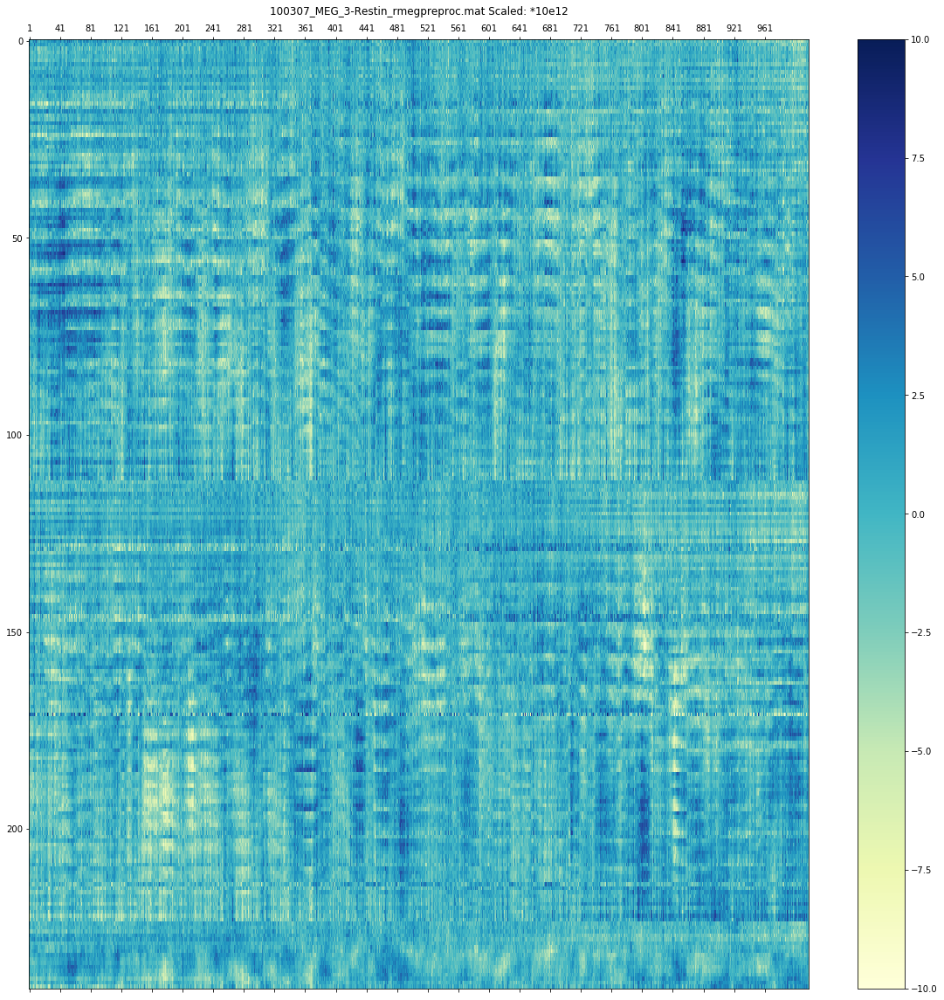

<Figure size 432x288 with 0 Axes>

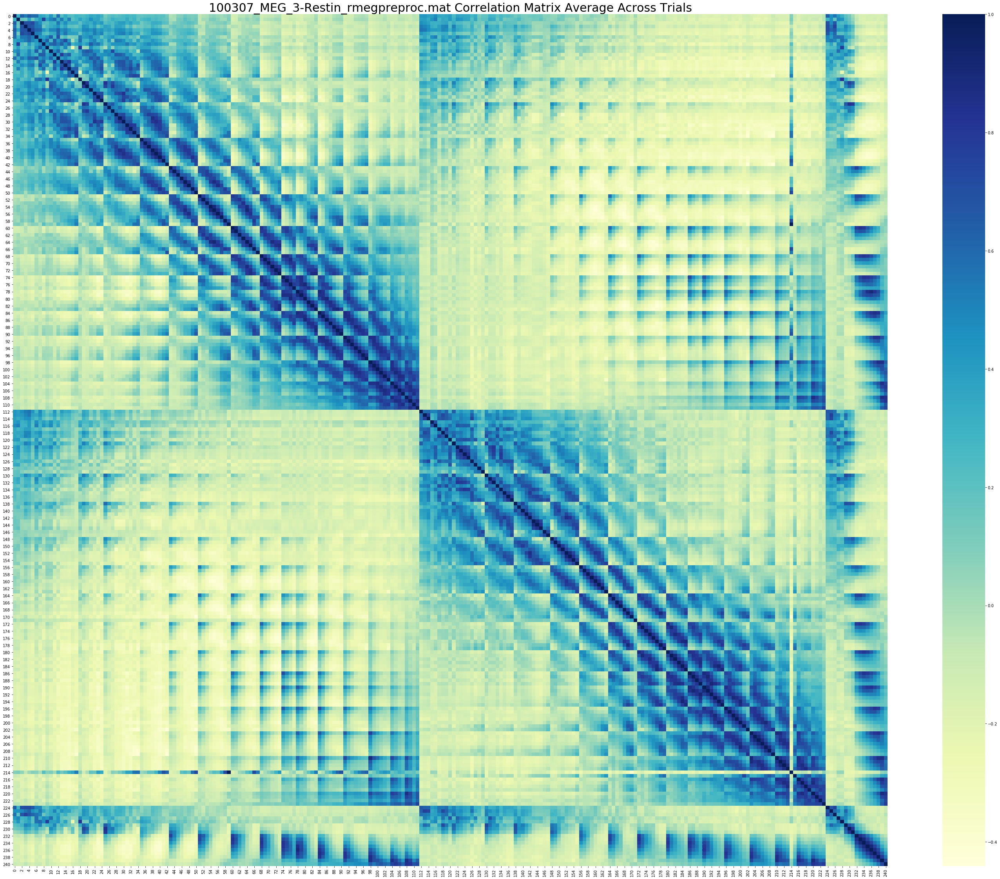

Start Processing Data: 100307_MEG_4-Restin_rmegpreproc.mat
Sensor channel position (271, 3) extracted...
Sensor channel type (271,) extracted...
Sensor channel label (271,) extracted...
Sampling frequency 508.62752490487884 extracted ...
Labels after preprocessing (246,) extracted ...
Trials after preprocessing (246, 1018, 132) extracted ...
The time course of the trials (1018,) extracted ...
Available left channels: 114
Available right channels: 115
Available middle channels: 17
Available channels: 246
246


<Figure size 432x288 with 0 Axes>

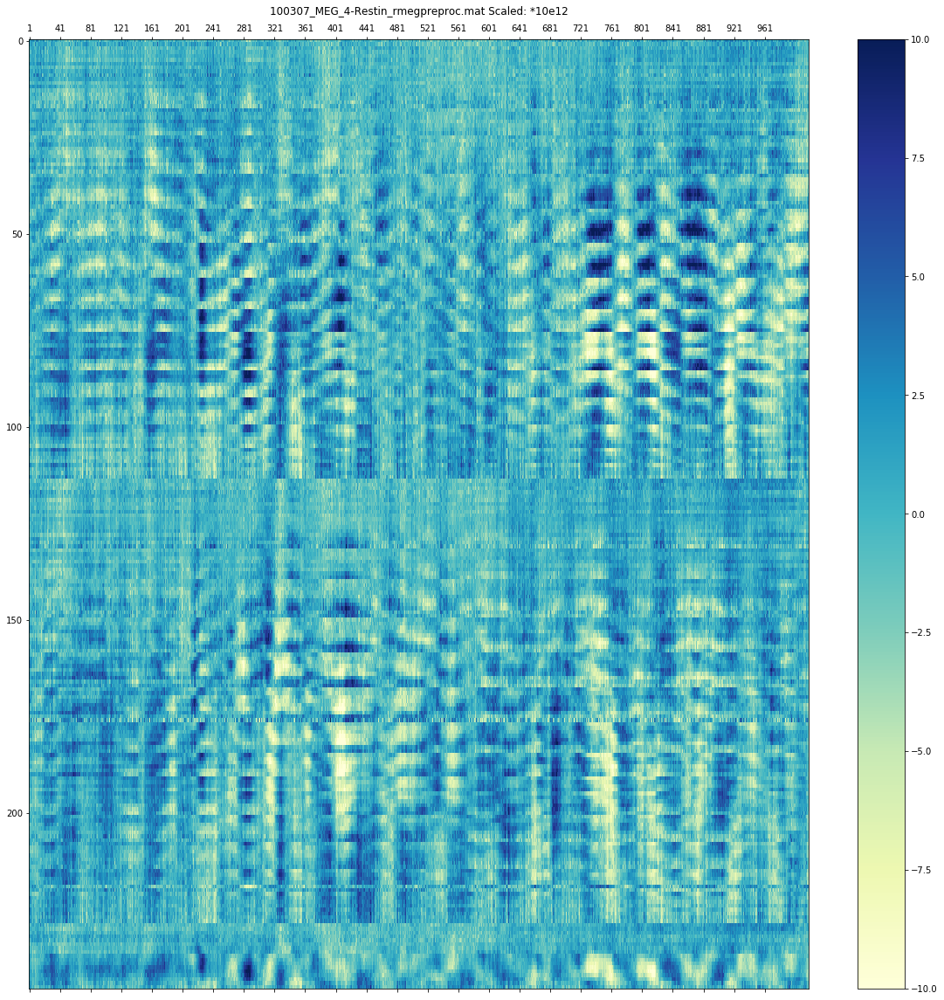

<Figure size 432x288 with 0 Axes>

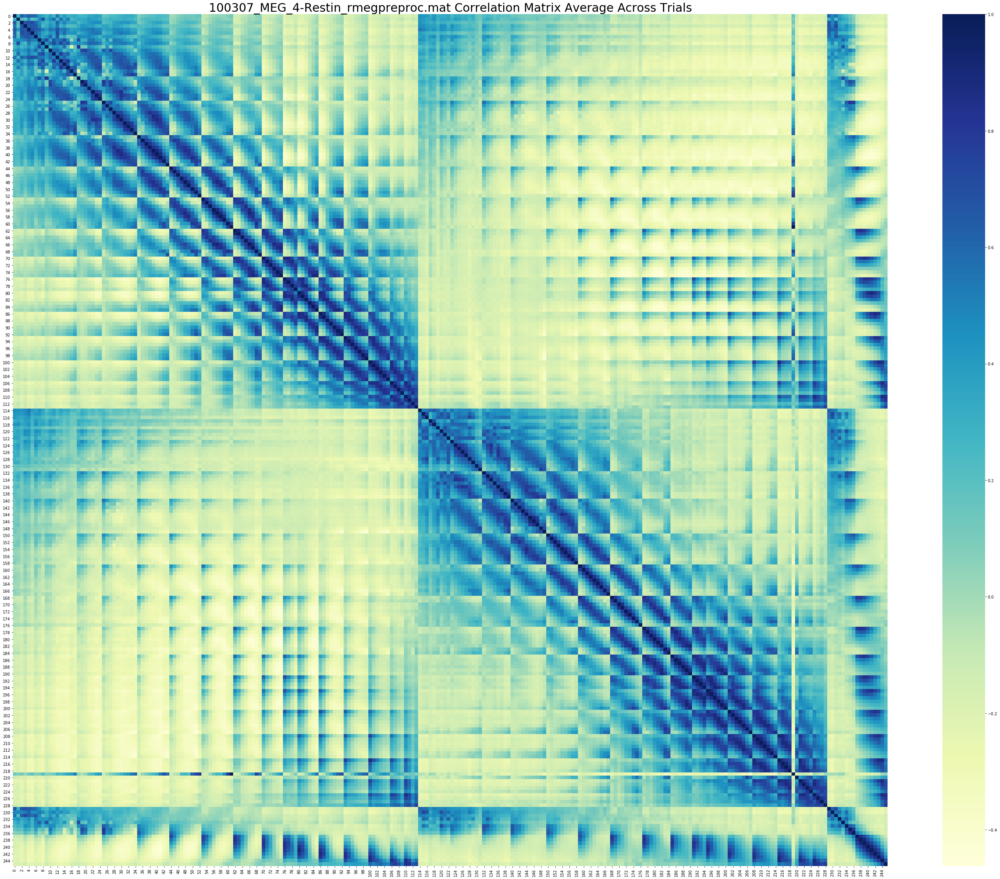

Start Processing Data: 100307_MEG_5-Restin_rmegpreproc.mat
Sensor channel position (271, 3) extracted...
Sensor channel type (271,) extracted...
Sensor channel label (271,) extracted...
Sampling frequency 508.62752490487884 extracted ...
Labels after preprocessing (246,) extracted ...
Trials after preprocessing (246, 1018, 146) extracted ...
The time course of the trials (1018,) extracted ...
Available left channels: 114
Available right channels: 115
Available middle channels: 17
Available channels: 246
246


<Figure size 432x288 with 0 Axes>

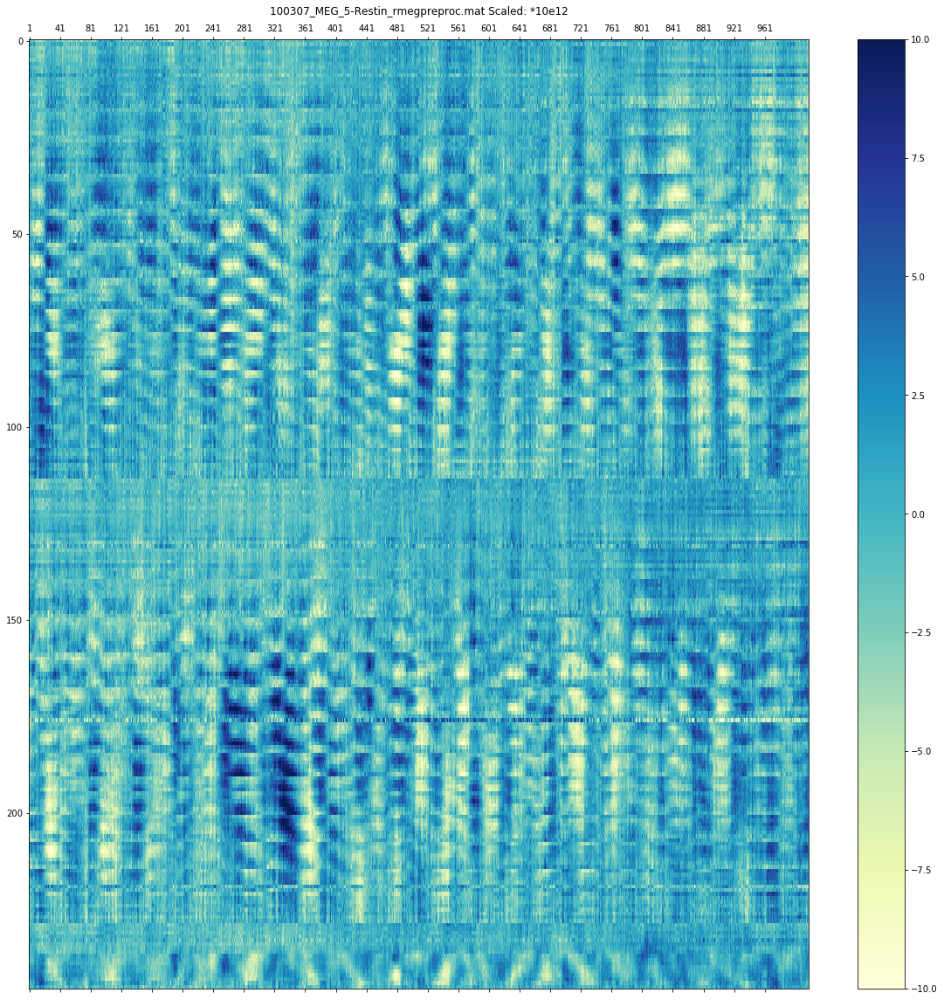

<Figure size 432x288 with 0 Axes>

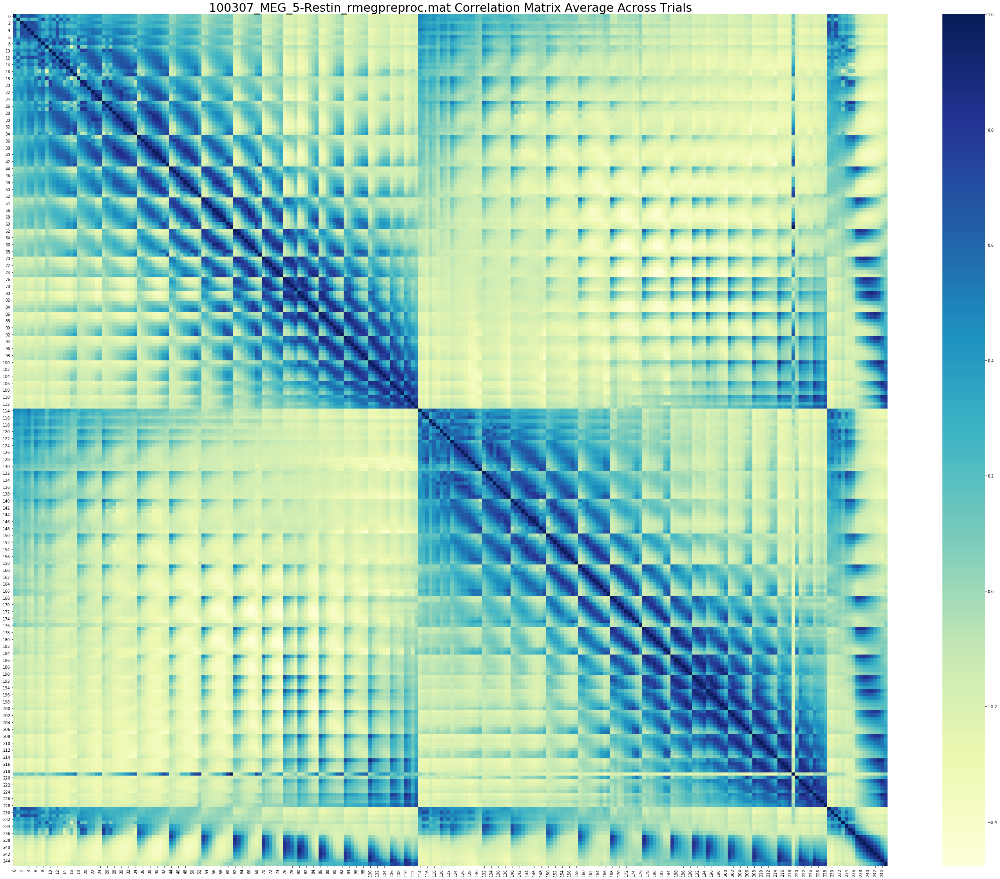

Start Processing Data: 116524_MEG_3-Restin_rmegpreproc.mat
Sensor channel position (271, 3) extracted...
Sensor channel type (271,) extracted...
Sensor channel label (271,) extracted...
Sampling frequency 508.62752490487884 extracted ...
Labels after preprocessing (244,) extracted ...
Trials after preprocessing (244, 1018, 147) extracted ...
The time course of the trials (1018,) extracted ...
Available left channels: 113
Available right channels: 114
Available middle channels: 17
Available channels: 244
244


<Figure size 432x288 with 0 Axes>

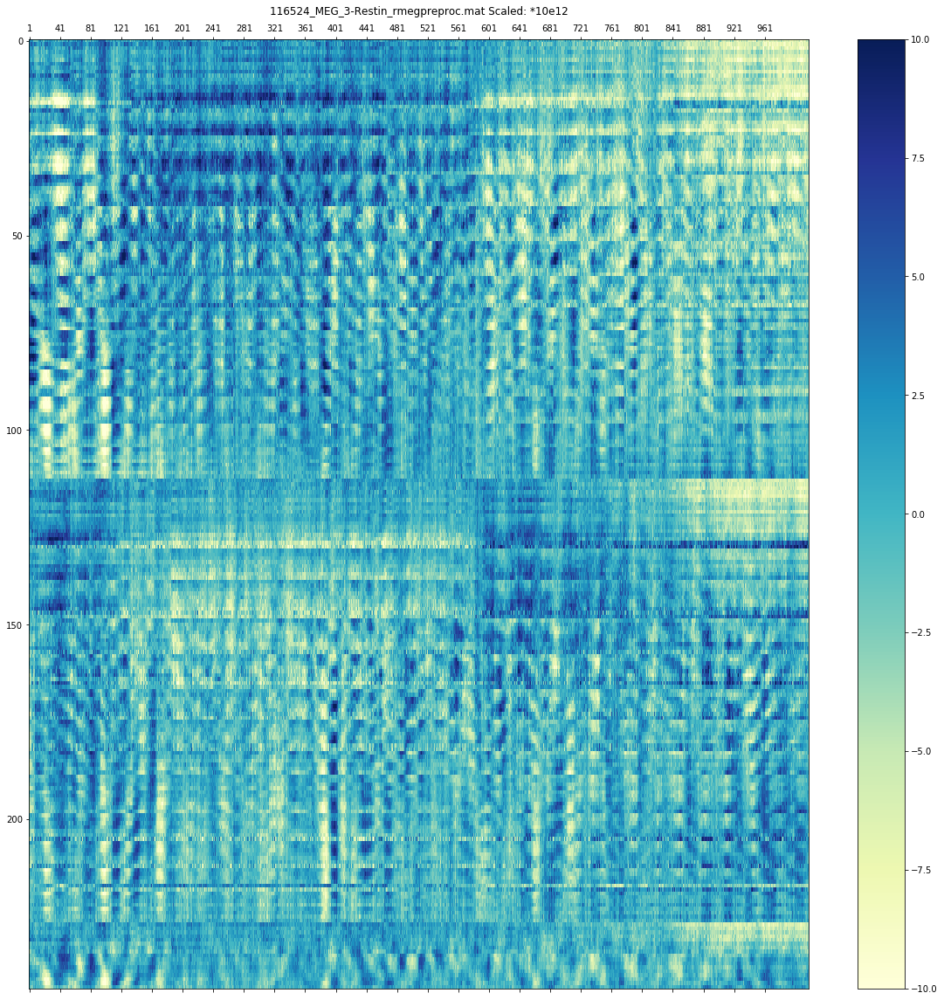

<Figure size 432x288 with 0 Axes>

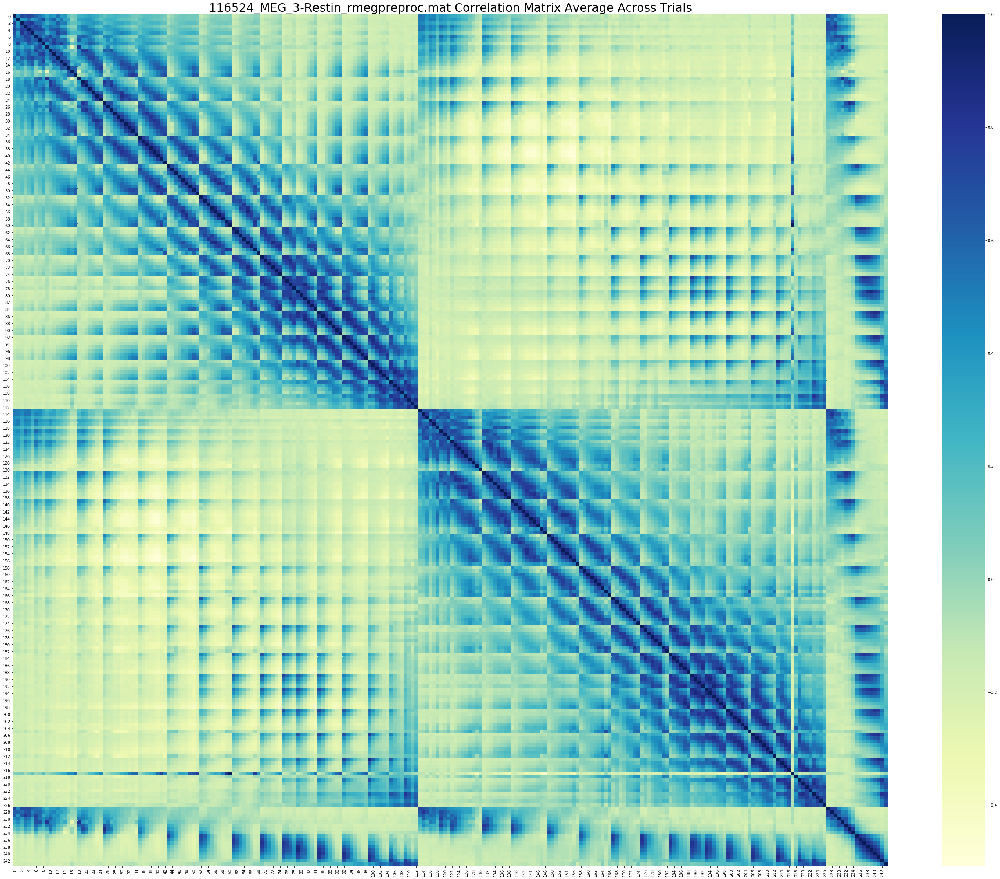

Start Processing Data: 116524_MEG_4-Restin_rmegpreproc.mat
Sensor channel position (271, 3) extracted...
Sensor channel type (271,) extracted...
Sensor channel label (271,) extracted...
Sampling frequency 508.62752490487884 extracted ...
Labels after preprocessing (245,) extracted ...
Trials after preprocessing (245, 1018, 125) extracted ...
The time course of the trials (1018,) extracted ...
Available left channels: 113
Available right channels: 115
Available middle channels: 17
Available channels: 245
245


<Figure size 432x288 with 0 Axes>

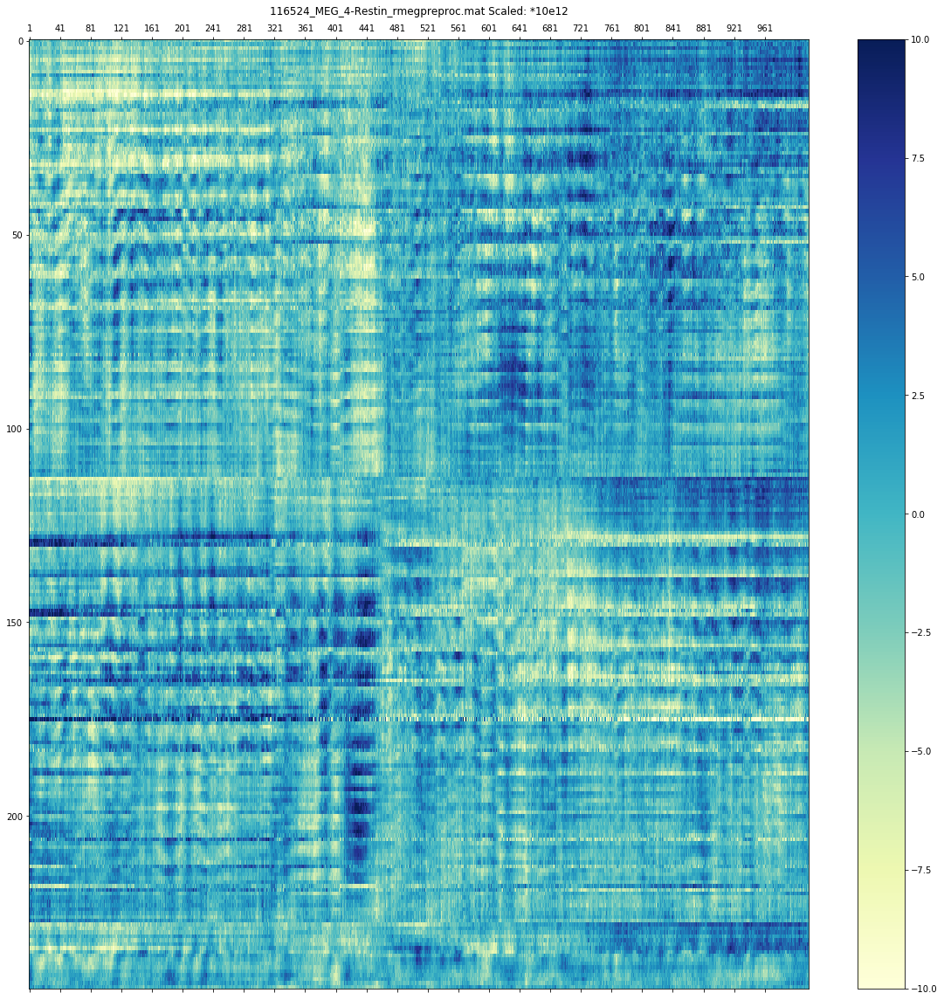

<Figure size 432x288 with 0 Axes>

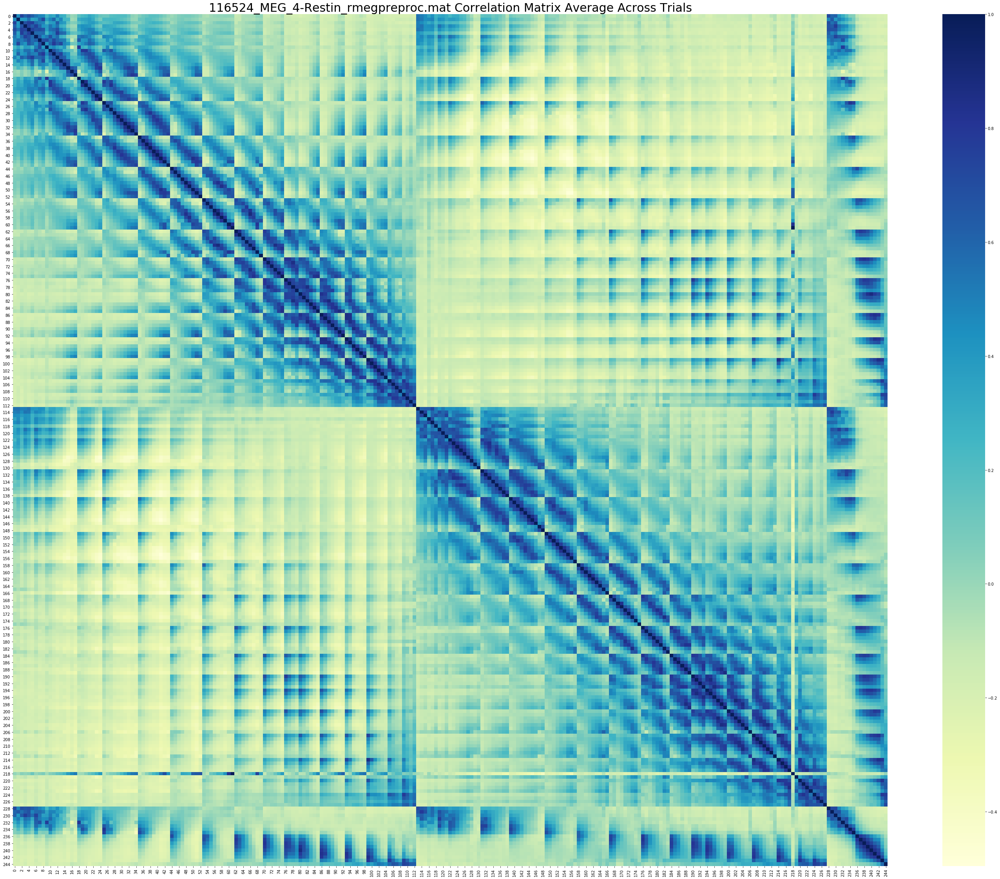

Start Processing Data: 116524_MEG_5-Restin_rmegpreproc.mat
Sensor channel position (271, 3) extracted...
Sensor channel type (271,) extracted...
Sensor channel label (271,) extracted...
Sampling frequency 508.62752490487884 extracted ...
Labels after preprocessing (245,) extracted ...
Trials after preprocessing (245, 1018, 119) extracted ...
The time course of the trials (1018,) extracted ...
Available left channels: 114
Available right channels: 114
Available middle channels: 17
Available channels: 245
245


<Figure size 432x288 with 0 Axes>

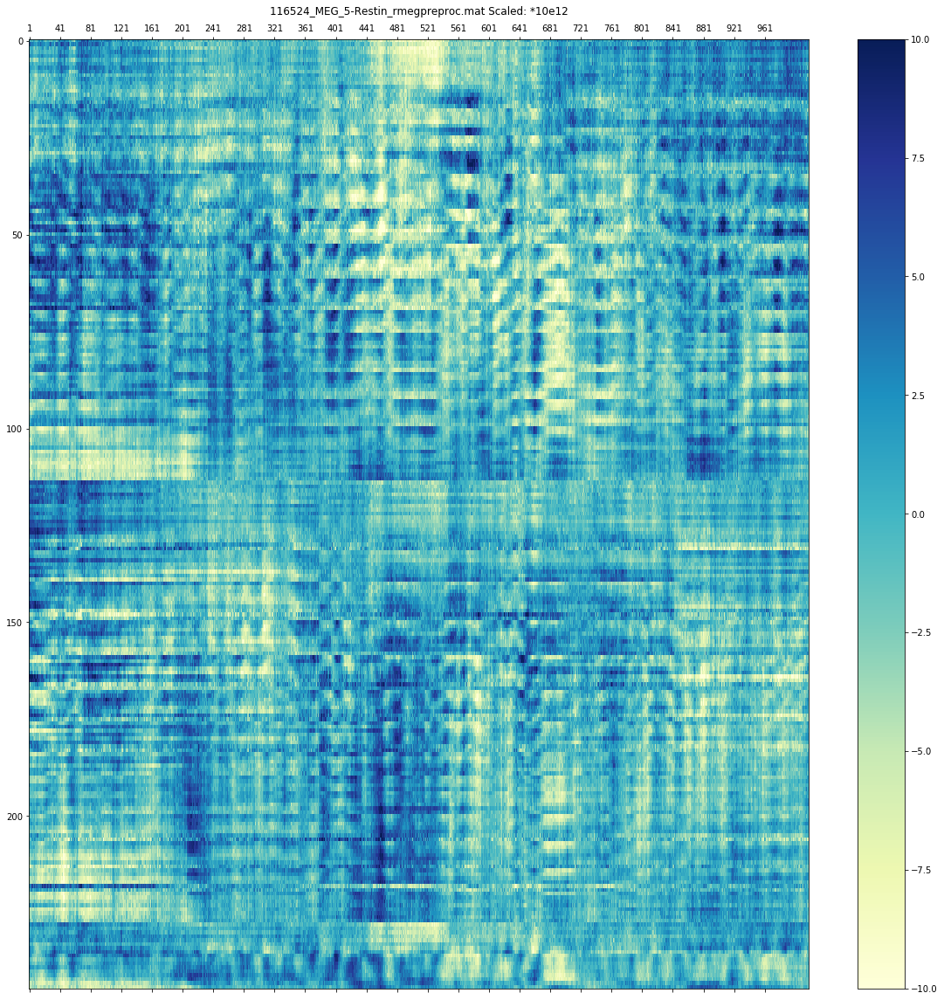

<Figure size 432x288 with 0 Axes>

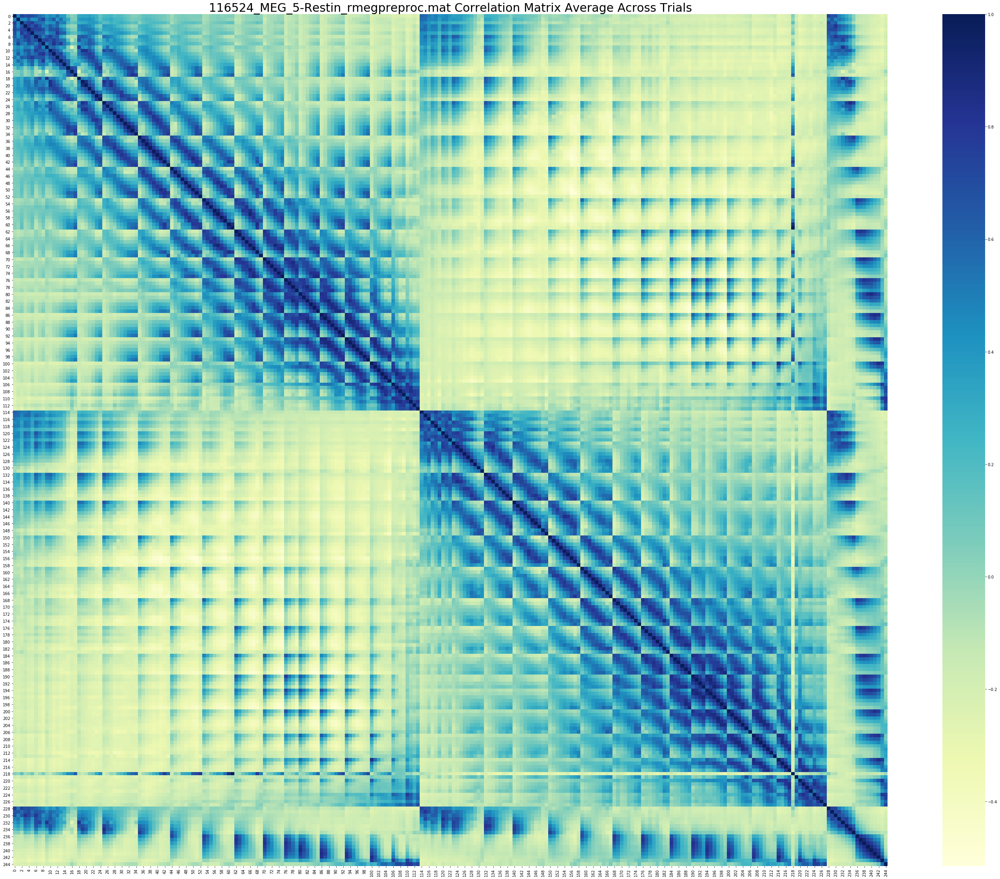

Start Processing Data: 158136_MEG_3-Restin_rmegpreproc.mat
Sensor channel position (271, 3) extracted...
Sensor channel type (271,) extracted...
Sensor channel label (271,) extracted...
Sampling frequency 508.62752490487884 extracted ...
Labels after preprocessing (243,) extracted ...
Trials after preprocessing (243, 1018, 126) extracted ...
The time course of the trials (1018,) extracted ...
Available left channels: 112
Available right channels: 114
Available middle channels: 17
Available channels: 243
243


<Figure size 432x288 with 0 Axes>

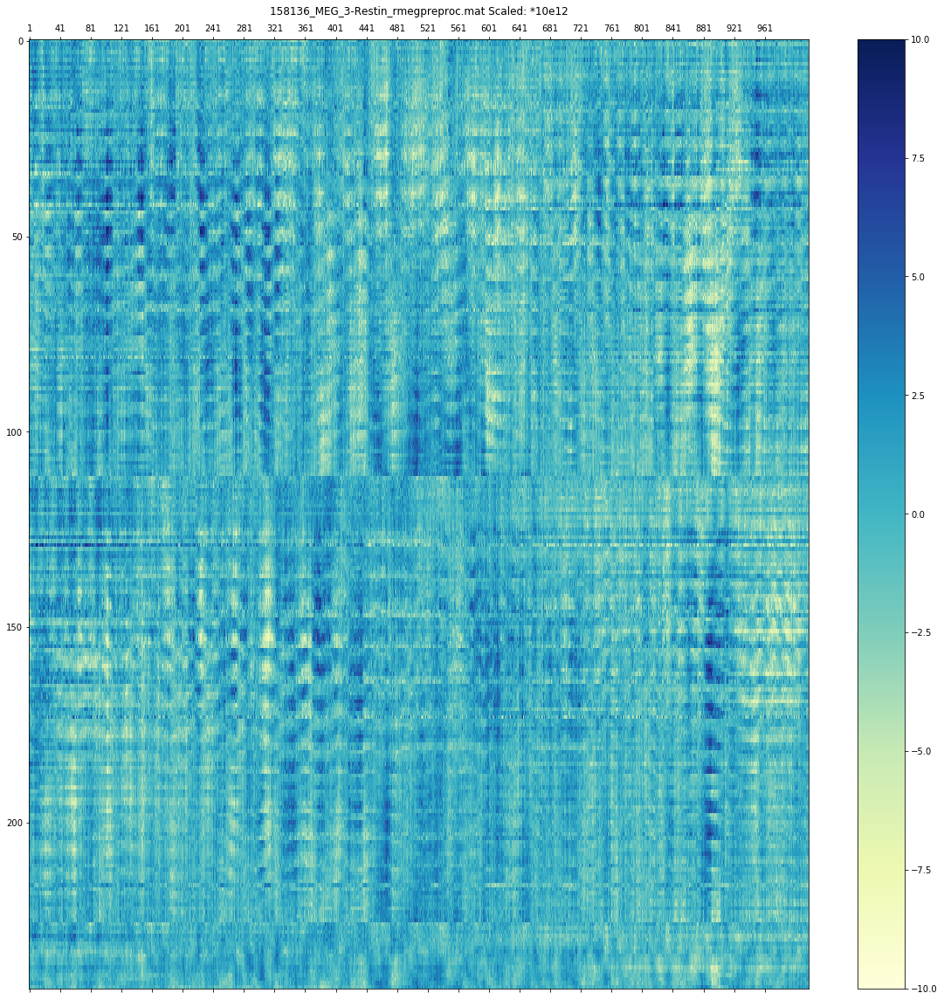

<Figure size 432x288 with 0 Axes>

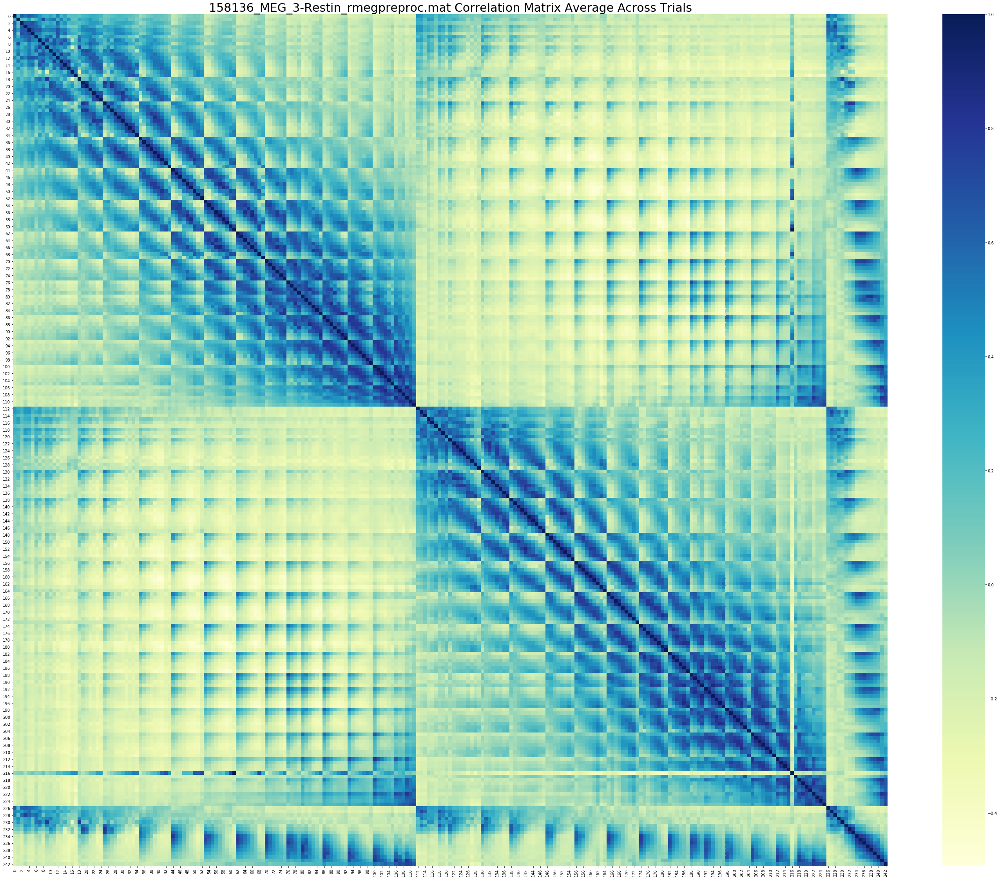

Start Processing Data: 158136_MEG_4-Restin_rmegpreproc.mat
Sensor channel position (271, 3) extracted...
Sensor channel type (271,) extracted...
Sensor channel label (271,) extracted...
Sampling frequency 508.62752490487884 extracted ...
Labels after preprocessing (244,) extracted ...
Trials after preprocessing (244, 1018, 130) extracted ...
The time course of the trials (1018,) extracted ...
Available left channels: 114
Available right channels: 113
Available middle channels: 17
Available channels: 244
244


<Figure size 432x288 with 0 Axes>

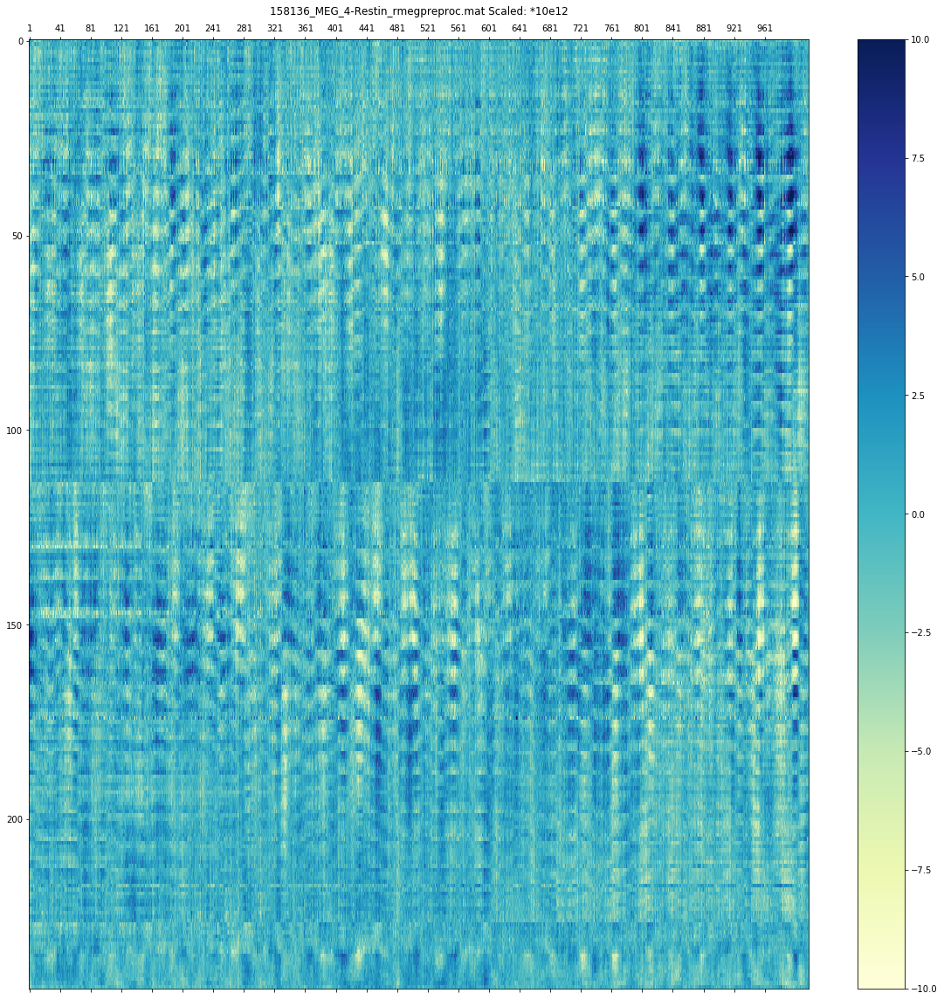

<Figure size 432x288 with 0 Axes>

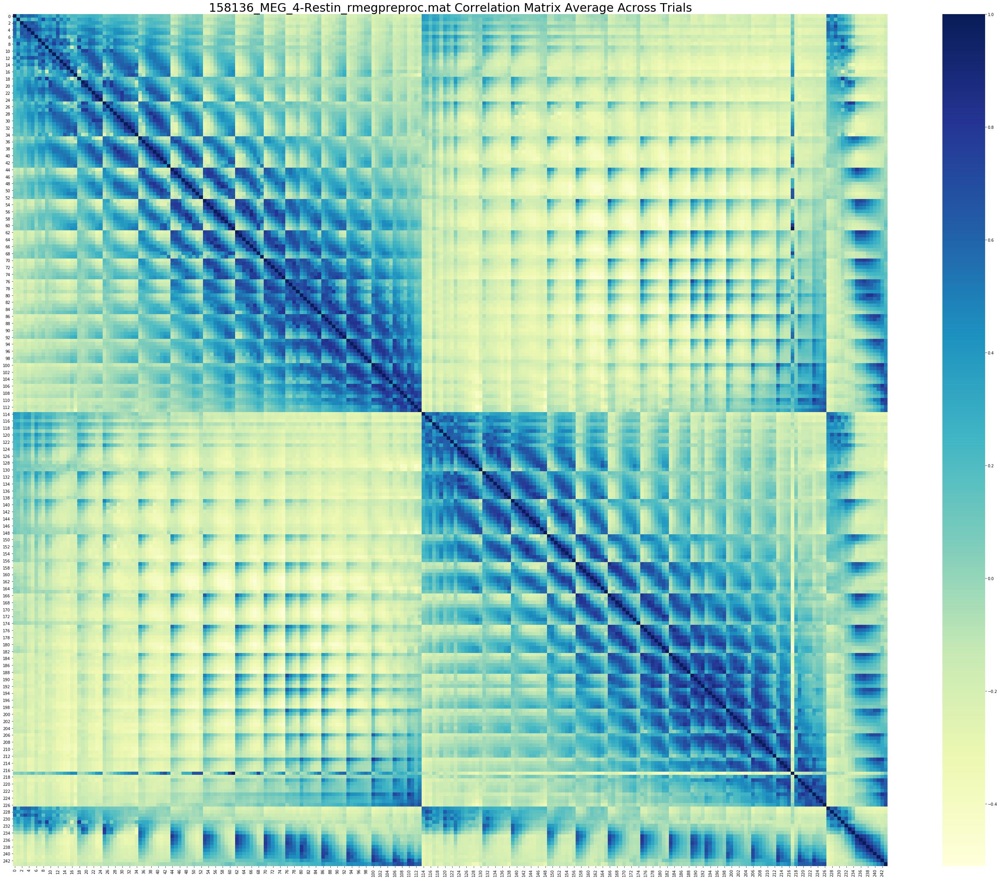

Start Processing Data: 158136_MEG_5-Restin_rmegpreproc.mat
Sensor channel position (271, 3) extracted...
Sensor channel type (271,) extracted...
Sensor channel label (271,) extracted...
Sampling frequency 508.62752490487884 extracted ...
Labels after preprocessing (246,) extracted ...
Trials after preprocessing (246, 1018, 146) extracted ...
The time course of the trials (1018,) extracted ...
Available left channels: 114
Available right channels: 115
Available middle channels: 17
Available channels: 246
246


<Figure size 432x288 with 0 Axes>

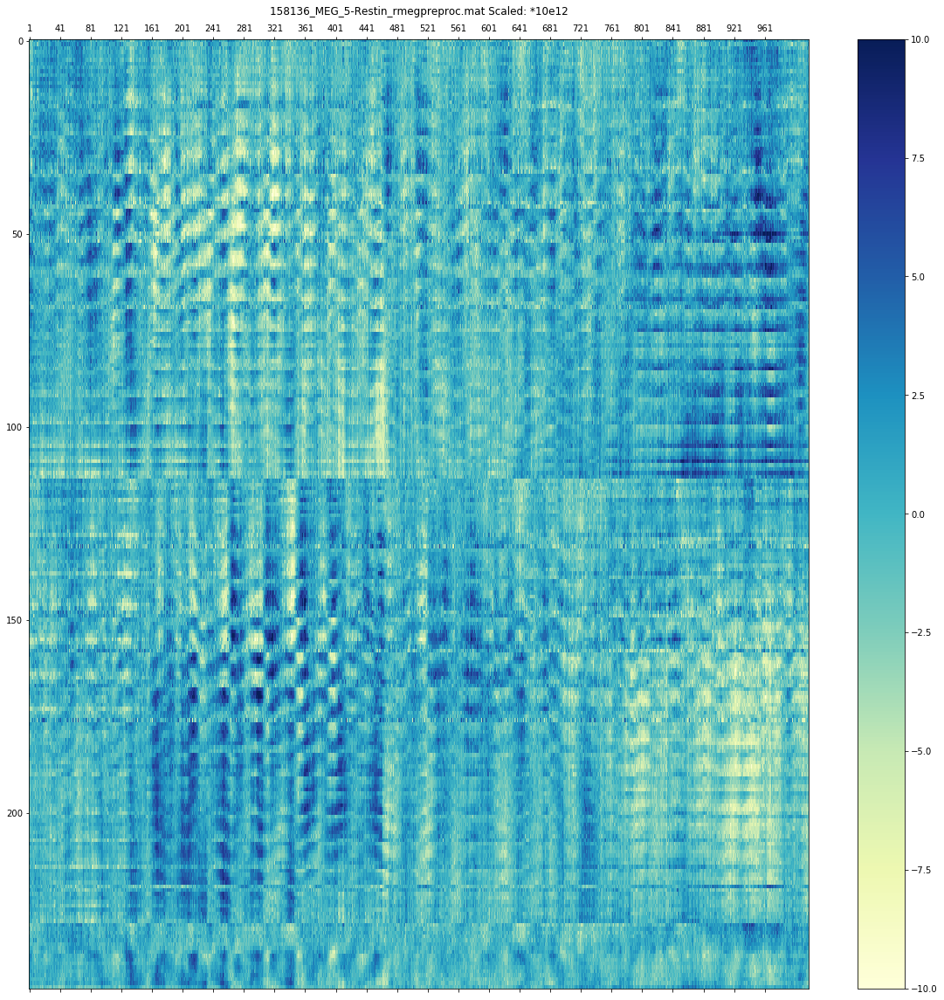

<Figure size 432x288 with 0 Axes>

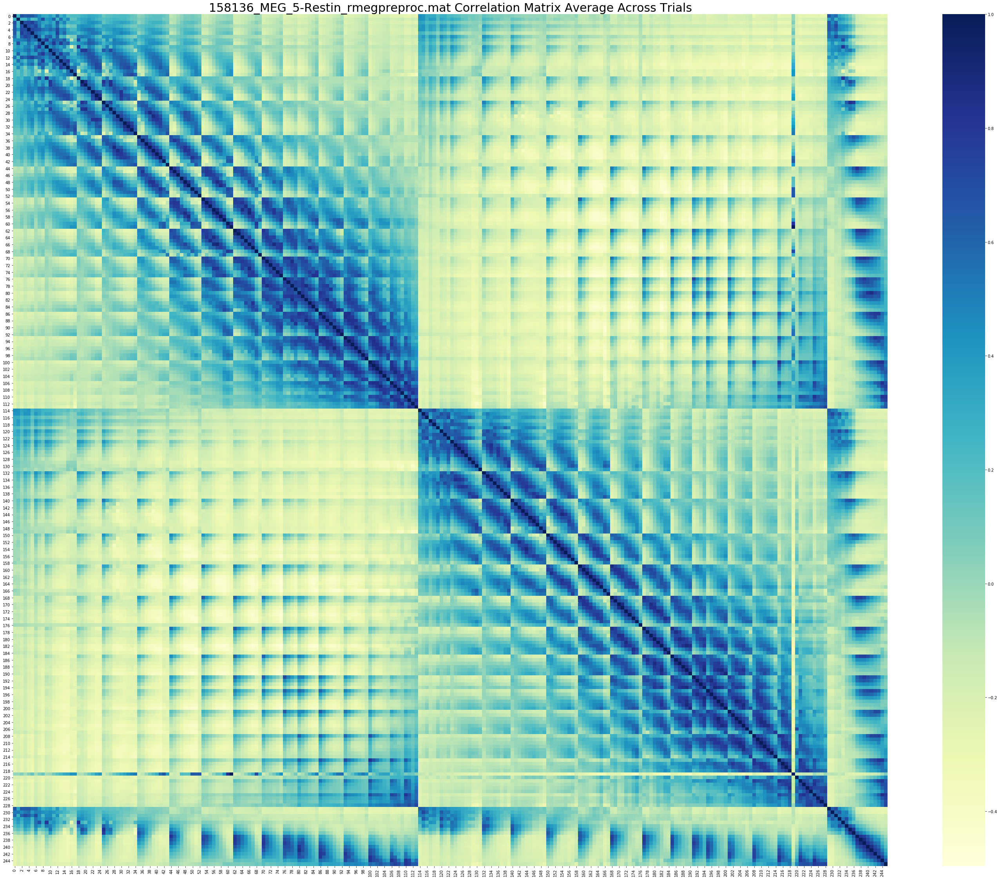

<Figure size 432x288 with 0 Axes>

In [7]:
for path in data_paths:
    analysis(path)